### Content Analysis News All without Covid
### Topic Modeling 

In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint
from collections import Counter

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

#TF-IDF
from sklearn.feature_extraction.text import TfidfTransformer,CountVectorizer

# spacy for lemmatization
import spacy

#nltk
from nltk.corpus import stopwords

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [2]:
def clean_address(row):
    name =  row.lower().split('/')
    if  row.lower().startswith('https') or  row.lower().startswith('http'):       
        return name[3]
    elif row.lower().startswith('www'):
        return name[1] 
    elif row.lower().startswith('facebook'):
        return name[1]
    else:
        print("Not found", row)
        return None

## 1. Reads  Info
Reads the information from all the posts from the studied period

In [3]:
import os
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [4]:

#path = "Latinx2020/"
p1 = pd.read_csv("news/FB_groups_News_Media_Outlets_abortion.csv")
p2 = pd.read_csv("news/FB_groups_News_Media_Outlets_climate_change.csv")
p4 = pd.read_csv("news/FB_groups_News_Media_Outlets_crime.csv")
p5 = pd.read_csv("news/FB_groups_News_Media_Outlets_economy.csv")
p6 = pd.read_csv("news/FB_groups_News_Media_Outlets_foreign_policy.csv")
p7 = pd.read_csv("news/FB_groups_News_Media_Outlets_gun_policy.csv")
p8 = pd.read_csv("news/FB_groups_News_Media_Outlets_health_care.csv")
p9 = pd.read_csv("news/FB_groups_News_Media_Outlets_immigration.csv")
p10 = pd.read_csv("news/FB_groups_News_Media_Outlets_racism.csv")
p11 = pd.read_csv("news/FB_groups_News_Media_Outlets_supreme_court.csv")
posts = pd.concat([p1,p2,p4,p5,p6,p7,p8,p9,p10,p11],axis=0)
#We rename the colum Page Name to be able to concat with Group Posts
posts.rename(columns={'Page Name':'Group Name'}, inplace=True)
posts.shape

(80668, 38)

In [5]:

posts.shape

(80668, 38)

In [6]:
posts['URL']

0       https://www.facebook.com/CNNee/posts/101576978...
1       https://www.facebook.com/primerahora/posts/101...
2       https://www.facebook.com/primerahora/posts/101...
3       https://www.facebook.com/peopleenespanol/posts...
4       https://www.facebook.com/univision/posts/10158...
                              ...                        
7171    https://www.facebook.com/telemundo39/posts/357...
7172    https://www.facebook.com/NoticiasBoston/posts/...
7173    https://www.facebook.com/NoticiasBoston/posts/...
7174    https://www.facebook.com/UnivisionNuevoMexico/...
7175    https://www.facebook.com/UnivisionNuevoMexico/...
Name: URL, Length: 80668, dtype: object

## 9. Filter the most relevant columns
### Add column to concat Message, Description, Link Text

In [7]:
concat_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('') + (' ' + posts['Link']).fillna('')
posts['MessageDescr'] = concat_message

concat_just_message = posts['Message'].fillna('') + (' ' + posts['Description']).fillna('')+ (' ' + posts['Link Text']).fillna('')
posts['MessageOnly'] = concat_just_message

In [8]:
posts.columns

Index(['Unnamed: 0', 'Group Name', 'User Name', 'Facebook Id',
       'Likes at Posting', 'Created', 'Type', 'Likes', 'Comments', 'Shares',
       'Love', 'Wow', 'Haha', 'Sad', 'Angry', 'Care', 'Video Share Status',
       'Post Views', 'Total Views', 'Total Views For All Crossposts',
       'Video Length', 'URL', 'Message', 'Link', 'Final Link', 'Image Text',
       'Link Text', 'Description', 'Sponsor Id', 'Sponsor Name',
       'Total Interactions',
       'Total Interactions (weighted  —  Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x )',
       'Overperforming Score', 'clean_url', 'State', 'Facebook',
       'MessageDescr', 'MessageOnly'],
      dtype='object')

In [9]:
posts["Created"].head(5)

0    2020-08-26 22:35:12 EDT
1    2020-08-26 14:06:18 EDT
2    2020-08-29 12:40:25 EDT
3    2020-08-21 15:32:06 EDT
4    2020-08-21 13:20:04 EDT
Name: Created, dtype: object

In [10]:
posts['converted_date'] = pd.to_datetime(posts["Created"])
posts['converted_date']

0      2020-08-26 22:35:12-04:00
1      2020-08-26 14:06:18-04:00
2      2020-08-29 12:40:25-04:00
3      2020-08-21 15:32:06-04:00
4      2020-08-21 13:20:04-04:00
                  ...           
7171   2020-11-01 12:32:26-05:00
7172   2020-11-03 14:03:17-05:00
7173   2020-11-01 10:00:30-05:00
7174   2020-11-03 14:03:22-05:00
7175   2020-11-01 10:00:30-05:00
Name: converted_date, Length: 80668, dtype: datetime64[ns, tzlocal()]

In [11]:
posts['converted_date']=posts['converted_date'].dt.date

In [12]:
import seaborn as sns
pd.set_option('display.max_rows', None)
group_date = posts.groupby('converted_date').agg({'Facebook Id':'count'}).reset_index().rename(columns={'Facebook Id':'count'})
group_date


,converted_date,count
0,2020-08-18,1107
1,2020-08-19,1392
2,2020-08-20,1526
3,2020-08-21,1097
4,2020-08-22,654
5,2020-08-23,373
6,2020-08-24,963
7,2020-08-25,1098
8,2020-08-26,1384
9,2020-08-27,1351


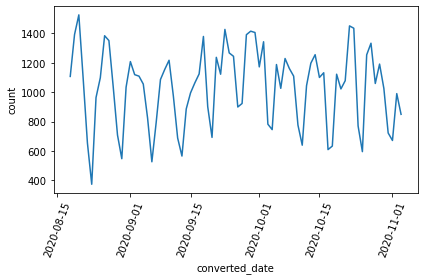

In [13]:
sns.lineplot(data=group_date, x='converted_date', y='count')
plt.xticks(rotation=70)
plt.tight_layout()

In [14]:
posts[posts['Link Text'].str.lower().str.contains("í", na = False)].head(1)

,Unnamed: 0,Group Name,User Name,Facebook Id,Likes at Posting,Created,Type,Likes,Comments,Shares,...,Sponsor Name,Total Interactions,Total Interactions (weighted — Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x ),Overperforming Score,clean_url,State,Facebook,MessageDescr,MessageOnly,converted_date
6,1683,Telemundo 47,Telemundo47,254932813632,994085.0,2020-08-21 23:48:06 EDT,Link,102,239,143,...,NaN,"1,459","1,459",17.16,telemundo47,New Jersey,https://www.facebook.com/Telemundo47,La Policía informó que el hombre abusó de su h...,La Policía informó que el hombre abusó de su h...,2020-08-21


In [15]:
#!/usr/bin/env python
import re

text = u'This is a smiley face \U0001f602'
print(text) # with emoji

def deEmojify(text):
    
    regrex_pattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                          
                           "]+", flags = re.UNICODE)
    
    
    return regrex_pattern.sub(r'',text)

print(deEmojify(text))

def deEmojify(inputString):
    return inputString.encode('ascii', 'ignore').decode('ascii')

This is a smiley face 😂
This is a smiley face 


In [16]:

posts['Group Name']=posts['Group Name'].apply(deEmojify)
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace('"', ''))
posts['Group Name']=posts['Group Name'].apply(lambda i: i.replace(',', ''))
posts['Facebook Id'] = posts['Facebook Id'].astype(int)



### 4. US states

In [17]:
us_states = pd.DataFrame({'State':['Alabama','Alaska','Arizona','Arkansas','California','Colorado','Connecticut','Delaware','District of Columbia','Florida',
             'Georgia','Hawaii','Idaho','Illinois','Indiana','Iowa','Kansas','Kentucky','Louisiana','Maine','Maryland','Massachusetts',
             'Michigan','Minnesota','Mississippi','Missouri','Montana','Nebraska','Nevada','New Hampshire','New Jersey','New Mexico',
             'New York','North Carolina','North Dakota','Ohio','Oklahoma','Oregon','Pennsylvania','Rhode Island','South Carolina',
             'South Dakota','Tennessee','Texas','Utah','Vermont','Virginia','Washington','West Virginia','Wisconsin','Wyoming']})

## 3. Which groups are publishing the majority of the content

In [18]:
group = posts.groupby(['Group Name'])
final_groups = group.agg({'Facebook Id':'count'}).sort_values(by='Facebook Id',ascending=False)
final_groups

,Facebook Id
Group Name,
CNN en Espaol,2628
La Noticia,1836
NoticiasYa Colorado,1722
NoticiasYa San Diego,1340
Telemundo Arizona,1300
Telemundo Nueva Inglaterra,1258
NOTICIAS DE PONCE,1204
Univision,1168
El Nuevo Da,1145


## Tokenize words and Clean-up text

In [19]:
content = posts.copy()
content.drop_duplicates(subset= ['MessageDescr'], inplace=True)
content['MessageDescr']

0        "Su creencia en la santidad de la vida trascie...
1        ¡Serán padres! La pareja publicó un video en e...
2        La perjudicada sufrió traumas en la cabeza y c...
3        "Somos tres. Inmensamente felices". Fernanda C...
4        ¡Bebé en camino! ¡Muchísimas felicidades! 🤰🥰🎊 ...
6        La Policía informó que el hombre abusó de su h...
7        La mujer, con alrededor de seis meses de embar...
8        Un estudio publicado en la revista Nature enco...
9        Aw, Dulce Maria luce divina con su pancita de ...
11       Karla Bermudez, de 22 años, recibió varios dis...
13        Una mujer con ocho meses de embarazo reportó ...
14       Emma Roberts está embarazada. El padre del beb...
15       Le dio multiples puños en la barriga: https://...
16       La perjudicada fue referida al Manatí Medical ...
17       Mike Pence: Biden es el "Caballo de Troya" de ...
18       Los hechos ocurrieron en Vega Alta http://ow.l...
19       Tenía 22 años y el bebé que llevaba en el vien.

In [20]:
content['cleanMessage'] = content['MessageDescr'].apply(lambda x: re.split('https:\/\/.*', str(x))[0])
content['cleanMessage'].shape

(59650,)

In [21]:
# Convert to list
data = content.cleanMessage.tolist()

In [22]:
# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]


In [23]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:2])

[['su', 'creencia', 'en', 'la', 'santidad', 'de', 'la', 'vida', 'trasciende', 'la', 'politica', 'por', 'su', 'valentia', 'el', 'presidente', 'donald', 'trump', 'tiene', 'el', 'apoyo', 'de', 'la', 'comunidad', 'antiaborto', 'dijo', 'sor', 'deirdre', 'byrne'], ['seran', 'padres', 'la', 'pareja', 'publico', 'un', 'video', 'en', 'el', 'que', 'muestra', 'un', 'resultado', 'positivo', 'de', 'embarazo', 'jovani', 'vazquez', 'su', 'novia', 'anuncian', 'que', 'esperan', 'un', 'bebe']]


#### Creating Bigram and Trigram Models

In [24]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['su', 'creencia', 'en', 'la', 'santidad', 'de', 'la', 'vida', 'trasciende', 'la', 'politica', 'por', 'su', 'valentia', 'el', 'presidente', 'donald', 'trump', 'tiene', 'el', 'apoyo', 'de', 'la', 'comunidad', 'antiaborto', 'dijo', 'sor', 'deirdre', 'byrne']


## Remove Stopwords, Make Bigrams and Lemmatize

In [25]:
#import nltk
#nltk.download('stopwords')
stop_words = stopwords.words('spanish')
stop_words.extend(stopwords.words('english'))
stop_words.extend(['su','sus','al','de','en','el','tal','con','mas','si','dos','pm','ser','ex','could','like','would','get','many','much','\ufeff1'])

In [26]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out


In [27]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
#https://stackoverflow.com/questions/54334304/spacy-cant-find-model-en-core-web-sm-on-windows-10-and-python-3-5-3-anacon
#!python3 -m spacy download es_core_news_sm
#!python3 -m spacy download en
nlp = spacy.load('es', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


In [28]:
data_lemmatized[0]

['creencia',
 'santidad',
 'vida',
 'trascender',
 'politica',
 'presidente',
 'trump',
 'apoyar',
 'antiaborto',
 'decir']

In [29]:
print(data_words_nostops[1:2])

[['seran', 'padres', 'pareja', 'publico', 'video', 'muestra', 'resultado', 'positivo', 'embarazo', 'jovani', 'vazquez', 'novia', 'anuncian', 'esperan', 'bebe']]


## Bag of Words

In [30]:
def combine_words(word1,word2,dictionary):

    if word1 in dictionary and word2 in dictionary:
        concat_name = word1+" / "+word2
        dictionary[concat_name] = dictionary[word1] + dictionary[word2]
        dictionary.pop(word1, None)
        dictionary.pop(word2, None)
        result = dictionary.pop(word1, None)
        result = dictionary.pop(word2, None)
    return dictionary

In [31]:
flat_list_words = [item for sublist in data_lemmatized for item in sublist]
count_words = Counter(flat_list_words)

In [32]:
final_dict = combine_words('donald','trump',count_words)
final_dict = combine_words('joe','biden',count_words)
final_dict = combine_words('kamala','harris',count_words)
final_dict = combine_words('american','america',count_words)
final_dict = combine_words('estados','unidos',count_words)
final_dict = combine_words('voters','vote',count_words)
final_dict = combine_words('mexico','mexican',count_words)
final_dict = combine_words('casa','blanca',count_words)
final_dict = combine_words('venezuela','venezuelans',count_words)
final_dict = combine_words('latino','latinos',count_words)
final_dict = combine_words('american / america','americans',count_words)
final_dict = combine_words('voters / vote','voting',count_words)
final_dict = combine_words('puerto','rico',count_words)
final_dict = combine_words('communism','communist',count_words)
final_dict = combine_words('ee','uu',count_words)
final_dict = combine_words('united','states',count_words)
final_dict = combine_words('president','presidente',count_words)
final_dict = combine_words('democrat','democrats',count_words)
final_dict = combine_words('informacion','informar',count_words)
final_dict = combine_words('covid','coronavirus',count_words)
final_dict = combine_words('democrat / democrats','democratas',count_words)

In [33]:
final_dict.most_common(1000)

[('salud', 12485),
 ('caso', 12101),
 ('covid / coronavirus', 11186),
 ('ano', 9790),
 ('personar', 8966),
 ('nuevo', 8456),
 ('donald / trump', 7211),
 ('decir', 7034),
 ('muerte', 6656),
 ('president / presidente', 5732),
 ('policia', 5297),
 ('hombre', 4897),
 ('mujer', 4621),
 ('reportar', 4495),
 ('hacer', 4456),
 ('condado', 4292),
 ('confirmar', 4104),
 ('autoridad', 3838),
 ('juez', 3780),
 ('publicar', 3717),
 ('partir', 3638),
 ('hoy', 3611),
 ('pandemia', 3549),
 ('poder', 3468),
 ('informacion / informar', 3432),
 ('millón', 3370),
 ('trabajar', 3245),
 ('mexico', 3206),
 ('total', 3201),
 ('ayudar', 3135),
 ('violencia', 3129),
 ('armar', 3112),
 ('detalle', 3092),
 ('casar', 3088),
 ('pasar', 2989),
 ('medicar', 2812),
 ('tirotear', 2789),
 ('aumentar', 2744),
 ('puerto_rico', 2657),
 ('programar', 2639),
 ('registrar', 2624),
 ('anunciar', 2619),
 ('ciudad', 2577),
 ('semana', 2539),
 ('federal', 2533),
 ('dar', 2477),
 ('contar', 2449),
 ('segun', 2387),
 ('octubre', 23

In [34]:
docs = ([' '.join(ele) for ele in data_lemmatized] )


In [35]:
cv=CountVectorizer() 
word_count_vector=cv.fit_transform(docs)
#word_count_vector.toarray()

# Convert bow_matrix into a DataFrame
bow_df = pd.DataFrame(word_count_vector.toarray())

# Map the column names to vocabulary 
bow_df.columns = cv.get_feature_names()

# Print bow_df
#print(bow_df)

In [36]:
tfidf_transformer=TfidfTransformer(smooth_idf=True,use_idf=True) 
tfidf_transformer.fit(word_count_vector)

TfidfTransformer()

In [37]:
# print idf values 
df_idf = pd.DataFrame(tfidf_transformer.idf_, index=cv.get_feature_names(),columns=["idf_weights"]) 
 
# sort ascending 
df_idf.sort_values(by=['idf_weights'])

,idf_weights
salud,2.823628
coronavirus,3.180451
ano,3.235656
personar,3.261545
nuevo,3.370039
decir,3.481877
caso,3.485695
trump,3.529104
presidente,3.666126
muerte,3.736549


In [38]:
# count matrix 
count_vector=cv.transform(docs) 
 
# tf-idf scores 
tf_idf_vector=tfidf_transformer.transform(count_vector)

In [39]:
feature_names = cv.get_feature_names() 
 
#get tfidf vector for first document 
first_document_vector=tf_idf_vector[0] 
 
#print the scores 
df = pd.DataFrame(first_document_vector.T.todense(), index=feature_names, columns=["tfidf"]) 
df = df[(df != 0).all(1)]
df.sort_values(by=["tfidf"],ascending=False)

,tfidf
santidad,0.487497
antiaborto,0.443620
creencia,0.409901
trascender,0.407344
politica,0.242325
apoyar,0.230828
vida,0.208606
presidente,0.164001
trump,0.157871
decir,0.155759


In [40]:
pd.set_option('display.max_colwidth',None)
#word = df.index[8]
word = r"\b(evento)\b"
content["lowercase"] = content['MessageOnly'].apply(lambda x: x.lower())
word_messages = content[content['lowercase'].str.contains(word)]
word_messages = word_messages['lowercase'].value_counts(ascending=False).rename_axis('unique_messages').reset_index(name='counts')

word_messages

/home/claudia/anaconda3/lib/python3.8/site-packages/pandas/core/strings.py:1954: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,unique_messages,counts
0,charlotte.- las autoridades de salud del condado mecklenburg informaron el viernes que sigue en aumento los casos de contagio de covid-19 relacionados con un evento en un iglesia de la zona que ocurrió del 4 al 11 de octubre. hasta el momento hay 3 personas muertas y 99 han sido diagnosticadas de c... aumentan número de contagiados de covid-19 relacionados con evento en iglesia de charlotte,3
1,"continuamos celebrando el mes de la herencia hispana compartiendo sus historias. en este episodio, aprenderemos sobre jorge martínez y cómo se graduó de la universidad con una beca completa. agradecemos a nuestros patrocinadores bank of america,novant health, y compare foods charlotte por hacer de este evento virtual una realidad. mes de la herencia hispana",3
2,"charlotte.- cuatro personas que asistieron a la convención nacional republicana en charlotte dieron positivo por el coronavirus, dijeron funcionarios de salud en el condado de mecklenburg de carolina del norte.wbtv informó el viernes que aquellos que dieron positivo en el evento fueron aislados de... cuatro personas que asistieron a convención republicana en charlotte tienen covid-19",3
3,"continuamos celebrando el mes de la herencia hispana compartiendo sus historias. en este episodio, aprenderemos sobre jennifer kaderkulof y su puesto como directora administrativa en charlotte community service association. agradecemos a nuestros patrocinadores bank of america, novant health y compare foods charlotte por hacer realidad este evento virtual. jennifer kaderkulof",3
4,"la oficina del sheriff del condado de rockland advirtió al departamento de salud estatal acerca del multitudinario evento que se celebraría. la oficina del sheriff del condado de rockland advirtió al departamento de salud estatal acerca del multitudinario evento que se celebraría en williamsburg. boda de más de 10,000 personas en brooklyn es bloqueada por funcionarios estatales de salud",3
5,"continuamos celebrando el mes de la herencia hispana compartiendo sus historias. en este episodio, aprenderemos sobre heydi quintanilla y cómo se graduó de delaware state university con una beca completa. agradecemos a nuestros patrocinadores bank of america, novant health, y compare foods charlotte por hacer de este evento virtual una realidad. mes de la herencia hispana",3
6,"continuamos celebrando el mes de la herencia hispana compartiendo sus historias. en este episodio, aprenderemos sobre lester oliva y su puesto como paramédico. agradecemos a nuestros patrocinadores bank of america , novant health y compare foods charlotte por hacer realidad este evento virtual. lester oliva",3
7,"llego el mes de la herencia hispana y queremos celebrar a lo grande la inmensa contribución que las personas de nuestra comunidad aportan a este hermoso país. a lo largo del mes, destacaremos a estudiantes, propietarios de empresas, y personalidades entre otros. así que no te pierdas el primer episodio de nuestro especial, y lo iniciaremos con manolo betancur propietario de manolo's bakery. agradecemos a nuestros patrocinadores bank of america, novant health, y compare foods charlotte por hacer de este evento virtual una realidad. mes de la herencia hispana",3
8,"¿vieron el concierto en vivo de bad bunny? ¿cómo les pareció? comenta abajo! en este episodio, aprenderemos mas del conejo malo y su historia. agradecemos a nuestros patrocinadores bank of america, novant health y compare foods por hacer realidad este evento virtual. mes de la herencia hispana",3
9,"continuamos celebrando el mes de la herencia hispana compartiendo sus historias. en este episodio, aprenderemos sobre raquel lynch y su puesto como directora ejecutiva de programas en goodwill industries of the southern piedmont. agradecemos a nuestros patrocinadores bank of america, novant health y compare food por hacer realidad este evento virtual. mes de la herencia hispana",2


### Repeated messages

In [41]:
content['Total Interactions']=content['Total Interactions'].astype(str).str.replace(',', '').astype(int)
results = content.groupby(['MessageDescr','Link']).aggregate({'MessageDescr': 'count','Likes': 'sum','Comments': 'sum', 'Shares': 'sum', 'Love': 'sum', 'Wow': 'sum', 'Haha': 'sum', 'Sad': 'sum',
       'Angry': 'sum', 'Care': 'sum','Total Interactions':'sum'})
results.rename(columns={"MessageDescr": "Counts"}, inplace=True)

#results.to_csv("mostpopularNewsMedia.csv")

In [42]:
##results.sort_values(by='Counts',ascending=False)

/home/claudia/anaconda3/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


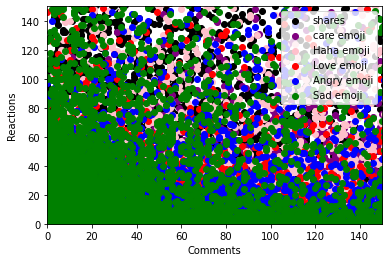

In [43]:
results.reset_index()
plt.xlim(0,150)
plt.ylim(0,150)

plt.xlabel('Comments')
plt.ylabel('Reactions')
plt.scatter(results.Comments, results.Shares,c='black',label='shares')
plt.scatter(results.Comments, results.Haha,c='purple',label='care emoji')
plt.scatter(results.Comments, results.Wow,c='pink',label='Haha emoji')
plt.scatter(results.Comments, results.Love,c='red',label='Love emoji')
plt.scatter(results.Comments, results.Angry,c='blue',label='Angry emoji')
plt.scatter(results.Comments, results.Sad,c='green',label='Sad emoji')

plt.legend()


## Topic Modeling
### Create the Dictionary and Corpus needed for Topic Modeling

In [44]:


# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)]]


[[('antiaborto', 1),
  ('apoyar', 1),
  ('creencia', 1),
  ('decir', 1),
  ('politica', 1),
  ('presidente', 1),
  ('santidad', 1),
  ('trascender', 1),
  ('trump', 1),
  ('vida', 1)]]

## Buiding the Topic Model

In [45]:

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

## View the topics in LDA model

In [46]:
# Print the Keyword in the 10 topics
#The weights reflect how important a keyword is to that topic.
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.210*"padre" + 0.192*"menos" + 0.140*"denunciar" + 0.121*"serio" + '
  '0.075*"victimar" + 0.004*"famoso" + 0.000*"juez" + 0.000*"ninos" + '
  '0.000*"separar" + 0.000*"abogar"'),
 (1,
  '0.219*"legal" + 0.118*"protestar" + 0.111*"destinar" + 0.083*"participar" + '
  '0.077*"historia" + 0.058*"tener" + 0.036*"abusar" + 0.034*"polemica" + '
  '0.030*"nina" + 0.015*"movimiento"'),
 (2,
  '0.213*"elección" + 0.131*"muerte" + 0.081*"rechazar" + 0.079*"ahora" + '
  '0.056*"familia" + 0.053*"libertar" + 0.047*"podria" + 0.042*"sentenciar" + '
  '0.041*"migrante" + 0.035*"lider"'),
 (3,
  '0.337*"nuevo" + 0.135*"publicar" + 0.134*"esperar" + 0.089*"dejar" + '
  '0.082*"nombrar" + 0.046*"ver" + 0.035*"saber" + 0.019*"redar" + '
  '0.015*"parejo" + 0.002*"novio"'),
 (4,
  '0.142*"solo" + 0.128*"tiempo" + 0.109*"llevar" + 0.083*"fin" + '
  '0.071*"hispano" + 0.065*"acordar" + 0.059*"mesar" + 0.041*"futuro" + '
  '0.027*"especial" + 0.022*"sufrio"'),
 (5,
  '0.186*"hacer" + 0.125*"corona

## Compute Model Perplexity and Coherence Score

In [47]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -22.626536097758894

Coherence Score:  0.30303615871131095


## Visualize the topics-keywords

In [48]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.340317  0.306474       1        1  13.094942
10     0.176349 -0.308671       2        1   8.987623
18    -0.012935  0.007463       3        1   8.353792
5      0.031818 -0.011757       4        1   7.894823
11     0.029673 -0.010638       5        1   7.584569
2      0.137411 -0.136336       6        1   7.062765
19     0.059617 -0.029417       7        1   5.759254
15     0.076492 -0.043328       8        1   5.286399
3      0.006649 -0.000017       9        1   5.177536
7     -0.104474  0.028408      10        1   4.373129
9      0.041983 -0.017581      11        1   4.367706
4     -0.041566  0.016226      12        1   3.977523
16    -0.055903  0.019619      13        1   2.990833
8     -0.082461  0.025018      14        1   2.749374
12    -0.011847  0.007088      15        1   2.633605
13    -0.131773  0.031184      16        1   2.612420
17    -0.093171  0.026732      17        1   2.215947
1     -0.094640  0.027019      18        1   1.796188
0     -0.127352  0.030824      19        1   1.656971
14    -0.144188  0.031690      20        1   1.424609, topic_info=                                 Term          Freq         Total Category  \
3                               decir  44650.000000  44650.000000  Default   
8                               trump  46298.000000  46298.000000  Default   
5                          presidente  34669.000000  34669.000000  Default   
58                                ano  26023.000000  26023.000000  Default   
153                             nuevo  20326.000000  20326.000000  Default   
202                           federal  13573.000000  13573.000000  Default   
21                              mujer  18564.000000  18564.000000  Default   
106                          elección  17509.000000  17509.000000  Default   
151                             hacer  17125.000000  17125.000000  Default   
82                              casar   9270.000000   9270.000000  Default   
403                            contar   9485.000000   9485.000000  Default   
526                            llegar  10380.000000  10380.000000  Default   
439                           viernes  10353.000000  10353.000000  Default   
377                          personar  14960.000000  14960.000000  Default   
115                       coronavirus  11530.000000  11530.000000  Default   
216                          justicia   9340.000000   9340.000000  Default   
273                               hoy  11271.000000  11271.000000  Default   
121                            muerte  10778.000000  10778.000000  Default   
84                              lunes   9644.000000   9644.000000  Default   
382                            fiscal  11396.000000  11396.000000  Default   
119                             medir  11024.000000  11024.000000  Default   
94                             partir  10670.000000  10670.000000  Default   
28                           anunciar   7584.000000   7584.000000  Default   
213                           despues   9465.000000   9465.000000  Default   
384                           detalle   7015.000000   7015.000000  Default   
147                          demandar  10611.000000  10611.000000  Default   
43                          confirmar  12365.000000  12365.000000  Default   
276                             pasar   8312.000000   8312.000000  Default   
405                          procesar   6899.000000   6899.000000  Default   
16                           publicar   8131.000000   8131.000000  Default   
8                               trump  46295.316406  46298.867188   Topic1   
5                          presidente  34665.609375  34669.160156   Topic1   
377                          personar  14957.119141  14960.666992   Topic1   
43                          confirmar  12361.935547  12365.483398   Topic1   
512                               ley  

## Building LDA Mallet Model

In [49]:
os.getcwd()

'/home/claudia/Documents/Latinx2020'

In [50]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
from gensim.models.wrappers import LdaMallet


In [51]:
mallet_path = '/home/claudia/Documents/Latinx2020/mallet-2.0.8/bin/mallet' # update this path

In [52]:
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

In [53]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(8,
  [('millón', 0.05676267475155802),
   ('desempleo', 0.03911066195048004),
   ('dolar', 0.03825164224355735),
   ('ayudar', 0.03759474482061647),
   ('pagar', 0.031665824490483406),
   ('recibir', 0.031598450395822805),
   ('impuesto', 0.029762506316321373),
   ('programar', 0.02630958396496547),
   ('federal', 0.023783055415192857),
   ('fondo', 0.01552972881926899)]),
 (16,
  [('centrar', 0.03273275938581699),
   ('lugar', 0.021762669743498712),
   ('hora', 0.02027158959794089),
   ('realizar', 0.0200408271944617),
   ('agente', 0.017928463654921453),
   ('tardar', 0.01615336824354309),
   ('manana', 0.015159314813171208),
   ('informar', 0.013330966539451495),
   ('cerrar', 0.01306470222774474),
   ('hoy', 0.012816188870151771)]),
 (5,
  [('poder', 0.040766394431234705),
   ('medir', 0.03158275612529722),
   ('usar', 0.030962472862607258),
   ('evitar', 0.02455287914814432),
   ('mantener', 0.016868258727040904),
   ('deber', 0.01626520555498122),
   ('seguir', 0.01590337365174

## Finding the optimal number of topics for LDA

In [54]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


In [55]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=40, step=6)

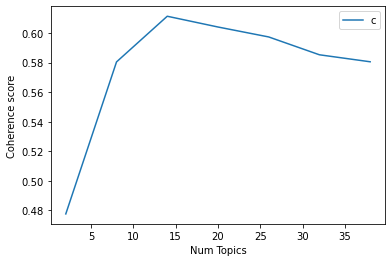

In [56]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [57]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.4777
Num Topics = 8  has Coherence Value of 0.5804
Num Topics = 14  has Coherence Value of 0.6113
Num Topics = 20  has Coherence Value of 0.604
Num Topics = 26  has Coherence Value of 0.5973
Num Topics = 32  has Coherence Value of 0.5852
Num Topics = 38  has Coherence Value of 0.5805


In [58]:
# Select the model and print the topics
optimal_model = model_list[3]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.054*"pandemia" + 0.027*"mayor" + 0.023*"hispano" + 0.023*"afectar" + '
  '0.020*"latino" + 0.020*"crisis" + 0.015*"casi" + 0.015*"impactar" + '
  '0.014*"alto" + 0.014*"mediar"'),
 (1,
  '0.170*"salud" + 0.055*"personar" + 0.048*"coronavirus" + 0.034*"virus" + '
  '0.030*"prueba" + 0.029*"publicar" + 0.024*"covid" + 0.022*"resultar" + '
  '0.022*"enfermedad" + 0.022*"paciente"'),
 (2,
  '0.034*"medir" + 0.029*"emplear" + 0.026*"anunciar" + 0.024*"trabajador" + '
  '0.023*"cerrar" + 0.020*"gobernador" + 0.016*"negocio" + 0.015*"ordenar" + '
  '0.014*"general" + 0.014*"seguridad"'),
 (3,
  '0.148*"nuevo" + 0.105*"coronavirus" + 0.048*"aumentar" + 0.036*"contagio" + '
  '0.026*"hoy" + 0.022*"numerar" + 0.019*"cifrar" + 0.018*"autoridad" + '
  '0.018*"segun" + 0.016*"dato"'),
 (4,
  '0.174*"caso" + 0.096*"muerte" + 0.065*"reportar" + 0.059*"confirmar" + '
  '0.046*"total" + 0.044*"informar" + 0.038*"registrar" + 0.031*"ano" + '
  '0.018*"probables_adicionales" + 0.018*"tomar"'),


## Finding the dominant topic in each sentence

In [59]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,7.0,0.1065,"trump, presidente, elección, votar, campana, candidato, noviembre, temer, debatir, estadounidense","""Su creencia en la santidad de la vida trasciende la política. Por su valentía, el presidente Donald Trump tiene el apoyo de la comunidad antiaborto”, dijo sor Deirdre Byrne"
1,1,10.0,0.1102,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",¡Serán padres! La pareja publicó un video en el que muestra un resultado positivo de embarazo. Jovani Vázquez y su novia anuncian que esperan un bebé
2,2,10.0,0.1121,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",La perjudicada sufrió traumas en la cabeza y comenzó a sentir contracciones Mujer le cae a puños a embarazada en Vega Alta
3,3,10.0,0.0883,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar","""Somos tres. Inmensamente felices"". Fernanda Castillo anuncia que espera su primer hijo junto a su prometido, el actor Erik Hayser. 😍 #Bebéencamino ¡Fernanda Castillo está embarazada!"
4,4,5.0,0.1474,"dar, luchar, conocer, racismo, hacer, mirar, historia, entrevistar, hablar, mensaje","¡Bebé en camino! ¡Muchísimas felicidades! 🤰🥰🎊 Hace tres meses la actriz anunció su compromiso con el actor y productor Erik Hayser, ahora sorprendió con otra noticia: será mamá por primera vez. Además de dar el anuncio, Fernanda Castillo compartió el ultrasonido de su primer hijo. ""Somos tres"": Fernanda Castillo confirma embarazo con la imagen de su bebé"
5,5,10.0,0.1557,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar","La Policía informó que el hombre abusó de su hija durante cuatro años. La menor, ahora de 13 años, tiene siete meses de embarazo."
6,6,13.0,0.1802,"policia, hombre, tirotear, autoridad, sospechoso, herir, oficial, robar, morir, encontrar","La mujer, con alrededor de seis meses de embarazo, trabajaba el turno de noche en un restaurante Jack in the Box cuando el sospechoso disparó contra ella durante el intento de robo. La mujer trabajaba el turno de noche en un restaurante Jack in the Box cuando un hombre, descrito como hispano, disparó contra ella durante el intento de robo. Una mujer embaraza es baleada durante el robo a un negocio al norte de Houston"
7,7,15.0,0.0789,"salud, experto, usar, evitar, riesgo, poner, seguir, mantener, mano, proteger",Un estudio publicado en la revista Nature encontró que el consumo de marihuana durante el embarazo aumentaría el riesgo de autismo en los bebés.
8,8,5.0,0.0879,"dar, luchar, conocer, racismo, hacer, mirar, historia, entrevistar, hablar, mensaje","Aw, Dulce Maria luce divina con su pancita de embarazo. ❤️ 🤰🏻 😍 Photos from Univisions post"
9,9,13.0,0.0982,"policia, hombre, tirotear, autoridad, sospechoso, herir, oficial, robar, morir, encontrar","Karla Bermudez, de 22 años, recibió varios disparos durante una balacera contra una casa alrededor de las 5:30 a.m. del lunes."


## Find the most representative document for each topic

In [60]:
#We will find the documents a given topic has contributed to the most and infer the topic by reading that document.
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
pd.set_option('display.max_colwidth', 400)
sent_topics_sorteddf_mallet

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
0,0.0,0.3852,"pandemia, mayor, hispano, afectar, latino, crisis, casi, impactar, alto, mediar","OIT: La pandemia ha destruido el trabajo equivalente a casi 500 millones de empleos Fecha: 23/09/2020 10:59 (UTC) Crédito: EFE Fuente: EFE Temática: Trabajo » Empleo Ginebra, 23 sep (EFE).- La pandemia provocó en el segundo trimestre de 2020 una pérdida de horas de trabajo equivalente a 495 millones de empleos, y entre enero y septiembre los ingresos de los trabajadores cayeron en 3,5 billones..."
1,1.0,0.3889,"salud, personar, coronavirus, virus, prueba, publicar, covid, resultar, enfermedad, paciente","¿Tienes diagnóstico de COVID19 o estuviste en riesgo de contraerlo? El Municipio Autónomo de Caguas ofrece asistencia para sus ciudadanos residentes que hayan resultado positivo a COVID19 o que hayan estado expuestos al virus. Apoyo Positivo Criollo es un programa de contacto y control de contagio que cuenta con un sistema de investigación de casos y rastreo de contactos. Además, ofrece servic..."
2,2.0,0.3949,"medir, emplear, anunciar, trabajador, cerrar, gobernador, negocio, ordenar, general, seguridad","Gobernadora extiende el toque de queda hasta el 16 de octubre o “salvo nuevo aviso” (Documento) Banner Ad Gobernadora extiende el toque de queda hasta el 16 de octubre o “salvo nuevo aviso” (Documento) LA FORTALEZA (CyberNews) – La gobernadora Wanda Vázquez Garced emitió el jueves, la Orden Ejecutiva 2020-076 el cual decreta una extensión de la vigente Orden Ejecutiva sobre el Toque de Queda ..."
3,3.0,0.3124,"nuevo, coronavirus, aumentar, contagio, hoy, numerar, cifrar, autoridad, segun, dato","Providence - El Departamento de Salud de Rhode Island (RIDOH) reporta el jueves 108 nuevos casos y 3 decesos adicionales. La cifra de contagiados desde el inicio de la pandemia alcanza los 21,589, la de fallecidos suman ya 1,044. Las pruebas realizadas el miércoles arrojaron una tasa de positividad del 1.3%. 82 personas se encuentran hospitalizadas, 10 en unidades de cuidados intensivos (3 en ..."
4,4.0,0.7836,"caso, muerte, reportar, confirmar, total, informar, registrar, ano, probables_adicionales, tomar","[LOCALES] COVID-19 PR: 12 muertes, 242 casos confirmados y 263 casos probables El informe del Departamento de Salud reportó 12 muertes por COVID-19; mientras, se registraron 242 casos confirmados y 263 casos probables adicionales. De las muertes registradas, once fueron catalogadas como confirmadas y se desglosan a continuación: – Mujer de 64 años de la región Metro – Hombre de 77 años de la r..."
5,5.0,0.3559,"dar, luchar, conocer, racismo, hacer, mirar, historia, entrevistar, hablar, mensaje","La nueva plataforma Disney + tuvo que hacer una serie de modificaciones a sus producciones más antiguas para colocar advertencias sobre el racismo para los espectadores que veían dibujos animados clásicos como Dumbo y Peter Pan. Cuando se ven en el servicio de transmisión de Disney +, películas como Los Aristogatos y El libro de la selva ahora muestran un mensaje sobre los estereotipos, según ..."
6,6.0,0.5249,"puerto_rico, partir, secretario, emergencia, isla, alcalde, representante, servicio, ley, presentar","[PorSiTeLoPerdiste] Investigan garantías de los derechos de empleados AEE tras acuerdo con LUMA Energy La Comisión de Desarrollo Económico, Planificación, Telecomunicaciones, Alianzas Público-Privadas y Energía, presidida por el representante Víctor Parés Otero, reanudó ayer los trabajos de la Resolución de la Cámara 64, para investigar el proceso que se está realizando para garantizar los der..."
7,7.0,0.3779,"trump, presidente, elección, votar, campana, candidato, noviembre, temer, debatir, estadounidense","Mike Pence visitó hoy el estado de Florida como parte de los últimos encuentros de la campaña de cara a las elecciones. Durante uno de sus mensajes en Florida Central, el vicepresidente discutió los logros de la administración Trump durante la pandemia, principalmente enfocado en la econom

In [61]:
sent_topics_sorteddf_mallet.to_csv("DominantTopicsFBGroupsStates.csv",encoding="utf-8-sig",index=False)

In [62]:
## Topic distribution across documents
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.dropna(inplace=True)
pd.set_option('display.max_colwidth', None)
df_dominant_topics

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0.0,7.0,"trump, presidente, elección, votar, campana, candidato, noviembre, temer, debatir, estadounidense",3213.0,0.0539
1.0,10.0,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",3402.0,0.0570
2.0,10.0,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",2954.0,0.0495
3.0,10.0,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",2652.0,0.0445
4.0,5.0,"dar, luchar, conocer, racismo, hacer, mirar, historia, entrevistar, hablar, mensaje",2578.0,0.0432
5.0,10.0,"ano, mujer, casar, hijo, menor, ninos, mesar, padre, joven, embarazar",3099.0,0.0520
6.0,13.0,"policia, hombre, tirotear, autoridad, sospechoso, herir, oficial, robar, morir, encontrar",1925.0,0.0323
7.0,15.0,"salud, experto, usar, evitar, riesgo, poner, seguir, mantener, mano, proteger",4762.0,0.0798
8.0,5.0,"dar, luchar, conocer, racismo, hacer, mirar, historia, entrevistar, hablar, mensaje",3500.0,0.0587
9.0,13.0,"policia, hombre, tirotear, autoridad, sospechoso, herir, oficial, robar, morir, encontrar",3875.0,0.0650
